<a href="https://colab.research.google.com/github/YanumulaRohith/Ai-ML_Externship/blob/main/Road_Detection_usingYOLOV11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# prompt: code to from the drive extract the zip file

import zipfile
import os

# Replace with the actual path to your zip file in Google Drive
zip_file_path = "/content/drive/MyDrive/drive-download-20250221T103732Z-001.zip"
extract_path = "/content/Dataset" # Directory to extract files

# Create the extract directory if it doesn't exist
if not os.path.exists(extract_path):
    os.makedirs(extract_path)

try:
  with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
  print(f"Successfully extracted files to {extract_path}")
except FileNotFoundError:
  print(f"Error: Zip file not found at {zip_file_path}")
except zipfile.BadZipFile:
  print(f"Error: Invalid zip file at {zip_file_path}")
except Exception as e:
  print(f"An unexpected error occurred: {e}")


Successfully extracted files to /content/Dataset


In [ ]:
!pip install ultralytics
from ultralytics import YOLO
model = YOLO("yolo11s.pt")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.5/921.5 kB 50.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 117.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 89.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

100%|██████████| 18.4M/18.4M [00:00<00:00, 350MB/s]


In [ ]:
import yaml
with open(r"dataset.yaml") as f:
    data=yaml.safe_load(f)

In [ ]:
data

{'train': '../train/images',
 'val': '../val/images',
 'test': '../test/images',
 'nc': 9,
 'names': {0: 'Trafic Light Signal',
  1: 'Stop Signal',
  2: 'Speedlimit Signal',
  3: 'Crosswalk Signal',
  4: 'Crosswalk',
  5: 'Pedestrian',
  6: 'Bus',
  7: 'Car',
  8: 'Truck'}}

In [ ]:
class_names=['Stop Signal','Speedlimit Signal','Crosswalk Signal','Crosswalk','Pedestrian','Bus','Car','Truck']

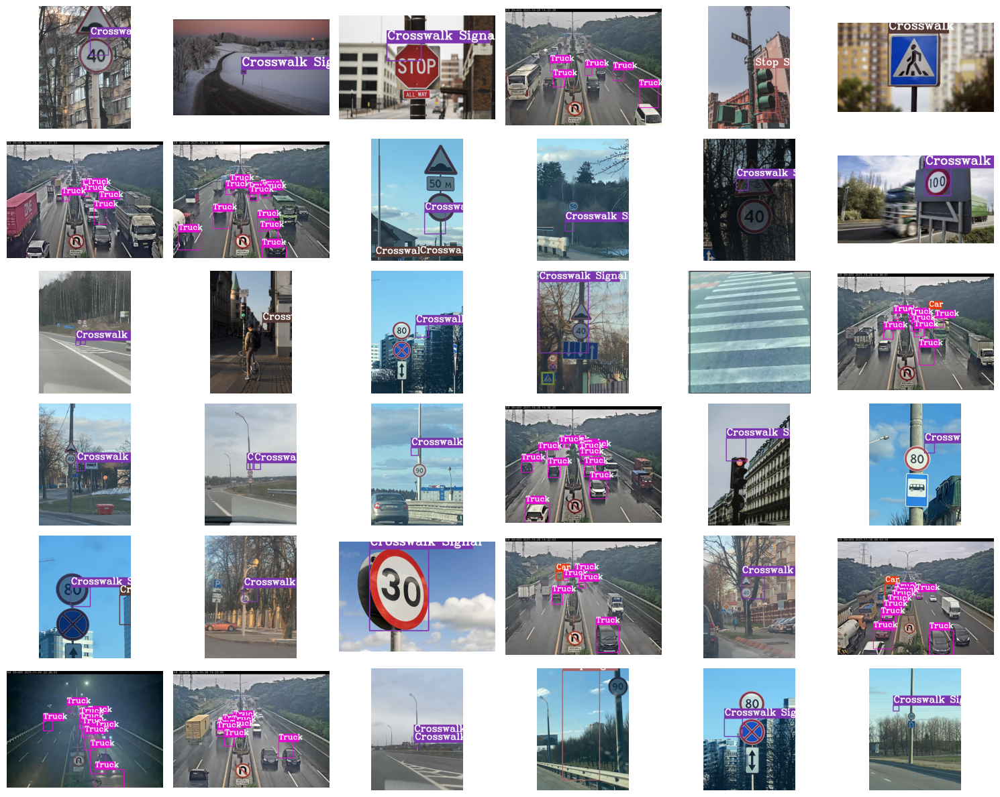

In [ ]:
import glob
from IPython.display import Image, display
import cv2
import random
import os
import matplotlib.pyplot as plt
import numpy as np
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0] - bboxes[2] / 2, bboxes[1] - bboxes[3] / 2
    xmax, ymax = bboxes[0] + bboxes[2] / 2, bboxes[1] + bboxes[3] / 2
    return xmin, ymin, xmax, ymax

def plot_box(image, bboxes, labels):
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        xmin = int(x1 * w)
        ymin = int(y1 * h)
        xmax = int(x2 * w)
        ymax = int(y2 * h)

        label_index = int(labels[box_num])
        if label_index >= len(class_names):
            continue

        class_name = class_names[label_index]

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=colors[label_index],
            thickness=2
        )

        font_scale = min(1, max(3, int(w / 500)))
        font_thickness = min(2, max(10, int(w / 50)))

        tw, th = cv2.getTextSize(class_name, 0, fontScale=font_scale, thickness=font_thickness)[0]
        cv2.rectangle(
            image,
            (xmin, ymin - th - 10), (xmin + tw, ymin),
            color=colors[label_index],
            thickness=-1
        )

        cv2.putText(
            image,
            class_name,
            (xmin + 1, ymin - 10),
            cv2.FONT_HERSHEY_COMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths + '/*.*') # Added /*.* to get all files in the directory
    all_training_labels = glob.glob(label_paths + '/*.*') # Added /*.* to get all files in the directory
    all_training_images.sort()
    all_training_labels.sort()

    num_images = len(all_training_images)
    plt.figure(figsize=(15, 12))

    for i in range(num_samples):
        j = random.randint(0, num_images - 1)
        image_path = all_training_images[j] # Get the full path of the image
        image = cv2.imread(image_path)

        if image is None:
            print(f"Error: Could not read image: {image_path}")
            continue # Skip this image if it can't be read

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                parts = label_line.strip().split(' ')
                label = int(parts[0])
                x_c, y_c, w, h = map(float, parts[1:])
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)

        result_image = plot_box(image, bboxes, labels)

        plt.subplot(6, 6, i + 1)
        plt.imshow(result_image)
        plt.axis('off')

    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

plot(image_paths=r'/content/Dataset/train/images',
     label_paths=r'/content/Dataset/train/labels',
     num_samples=36)

In [ ]:
model.train(
    data=r"dataset.yaml",
    epochs=10,
    imgsz=480)

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=dataset.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train43, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_

train: Scanning /content/Dataset/train/labels.cache... 1259 images, 7 backgrounds, 0 corrupt: 100%|██████████| 1261/1261 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/Dataset/val/labels.cache... 158 images, 0 backgrounds, 0 corrupt: 100%|██████████| 158/158 [00:00<?, ?it/s]


Plotting labels to runs/detect/train43/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 2 dataloader workers
Logging results to runs/detect/train43
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10       2.5G      1.758      2.721      1.449        107        480: 100%|██████████| 79/79 [00:23<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]

                   all        158        794      0.867      0.474      0.616      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.42G      1.403      1.255      1.151         80        480: 100%|██████████| 79/79 [00:20<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

                   all        158        794      0.798      0.721      0.756      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.45G      1.365      1.084      1.118         85        480: 100%|██████████| 79/79 [00:21<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.12it/s]


                   all        158        794      0.784      0.719      0.755       0.54

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.42G      1.331      1.006      1.109         93        480: 100%|██████████| 79/79 [00:20<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.37it/s]

                   all        158        794      0.798      0.728      0.778      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.41G      1.295     0.9476       1.09         91        480: 100%|██████████| 79/79 [00:19<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.18it/s]


                   all        158        794      0.866      0.706       0.79      0.562

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.41G      1.258     0.8858      1.054         54        480: 100%|██████████| 79/79 [00:21<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.92it/s]

                   all        158        794      0.864      0.763       0.82      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.43G      1.256     0.8531      1.063         92        480: 100%|██████████| 79/79 [00:19<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

                   all        158        794      0.816      0.772      0.827      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.43G      1.202      0.814      1.045         72        480: 100%|██████████| 79/79 [00:20<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.88it/s]

                   all        158        794      0.865      0.761      0.819        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.41G       1.21     0.7976      1.048         71        480: 100%|██████████| 79/79 [00:21<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.87it/s]

                   all        158        794      0.871      0.776      0.831      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.43G       1.19     0.7802      1.047        105        480: 100%|██████████| 79/79 [00:19<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.85it/s]

                   all        158        794      0.899      0.749      0.837       0.62



10 epochs completed in 0.067 hours.
Optimizer stripped from runs/detect/train43/weights/last.pt, 19.1MB
Optimizer stripped from runs/detect/train43/weights/best.pt, 19.1MB

Validating runs/detect/train43/weights/best.pt...
Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,416,283 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.30it/s]


                   all        158        794      0.899      0.749      0.837      0.619
   Trafic Light Signal          8         16      0.967      0.625      0.758      0.545
           Stop Signal          8          8      0.806          1      0.982      0.886
     Speedlimit Signal         67         71       0.99          1      0.995      0.877
      Crosswalk Signal         17         21      0.848      0.619      0.759      0.598
             Crosswalk         17         18          1      0.828      0.911      0.676
            Pedestrian         10         29      0.756      0.828      0.825      0.584
                   Bus          8          9      0.955      0.556      0.614      0.436
                   Car         45        407      0.912      0.611      0.825      0.448
                 Truck         43        215      0.858      0.674      0.862      0.521
Speed: 0.4ms preprocess, 4.3ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/detect

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78ebc46a17d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0470

In [ ]:
metrics = model.val(split='val')

print(f"Mean Average Precision @.5:.95 : {metrics.box.map}")
print(f"Mean Average Precision @ .50   : {metrics.box.map50}")
print(f"Mean Average Precision @ .70   : {metrics.box.map75}")
print("recall : ",metrics.box.r)
print(metrics.box.f1)
print(metrics.box.maps)

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,416,283 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning /content/Dataset/val/labels.cache... 158 images, 0 backgrounds, 0 corrupt: 100%|██████████| 158/158 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]


                   all        158        794        0.9      0.752      0.837      0.621
   Trafic Light Signal          8         16      0.956      0.625      0.757      0.545
           Stop Signal          8          8      0.803          1      0.982      0.886
     Speedlimit Signal         67         71      0.989          1      0.995      0.876
      Crosswalk Signal         17         21      0.862      0.619      0.762      0.616
             Crosswalk         17         18          1      0.834      0.911      0.676
            Pedestrian         10         29      0.751      0.828      0.824      0.585
                   Bus          8          9      0.973      0.556      0.616      0.438
                   Car         45        407       0.91      0.619      0.823      0.449
                 Truck         43        215       0.86      0.685      0.861       0.52
Speed: 1.3ms preprocess, 5.1ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect


image 1/1 /content/Dataset/test/images/i1693.jpg: 384x480 7 Cars, 3 Trucks, 18.5ms
Speed: 2.0ms preprocess, 18.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 480)


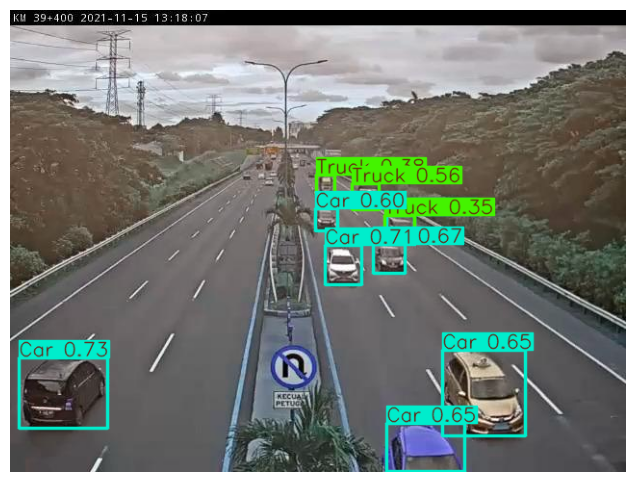


image 1/1 /content/Dataset/test/images/i361.png: 480x384 1 Speedlimit Signal, 1 Crosswalk Signal, 19.6ms
Speed: 4.3ms preprocess, 19.6ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 384)


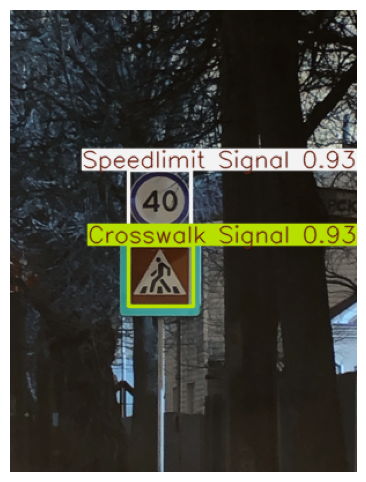


image 1/1 /content/Dataset/test/images/i766.png: 480x384 1 Speedlimit Signal, 11.0ms
Speed: 2.2ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 384)


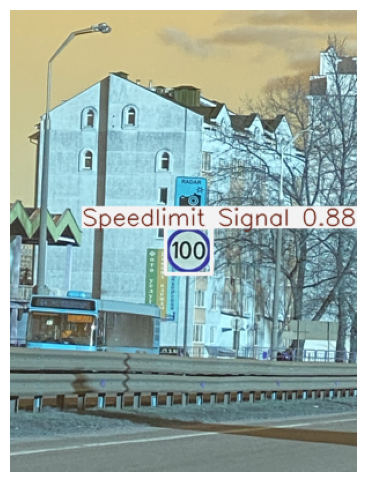


image 1/1 /content/Dataset/test/images/i1056.jpg: 480x480 1 Crosswalk, 16.0ms
Speed: 2.6ms preprocess, 16.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 480)


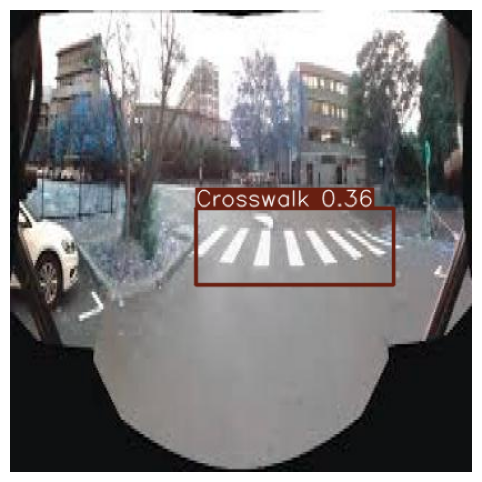


image 1/1 /content/Dataset/test/images/i1308.jpg: 384x480 16 Cars, 4 Trucks, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 480)


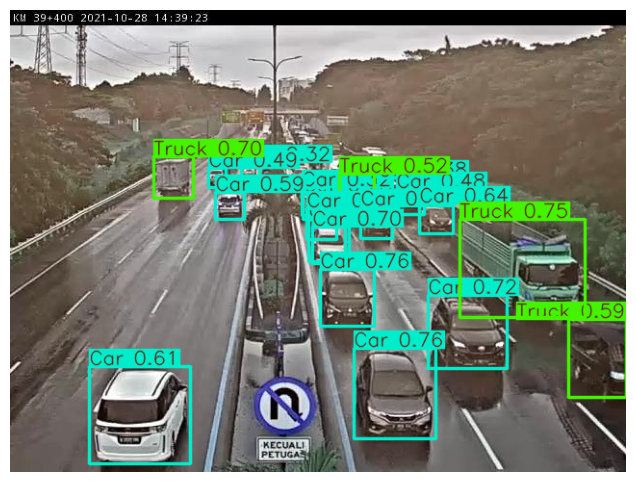


image 1/1 /content/Dataset/test/images/i1321.jpg: 384x480 6 Cars, 2 Trucks, 12.9ms
Speed: 3.3ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 480)


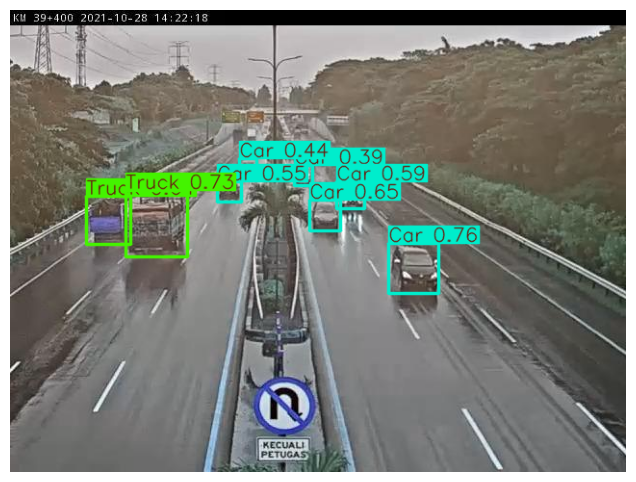


image 1/1 /content/Dataset/test/images/i566.png: 480x384 1 Speedlimit Signal, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


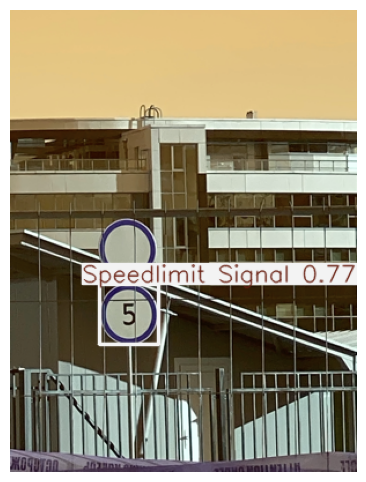


image 1/1 /content/Dataset/test/images/i40.png: 480x320 2 Trafic Light Signals, 8 Pedestrians, 14.7ms
Speed: 2.0ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 320)


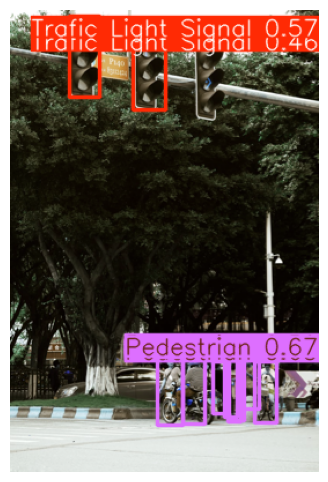


image 1/1 /content/Dataset/test/images/i1731.jpg: 384x480 14 Cars, 6 Trucks, 13.9ms
Speed: 2.9ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 480)


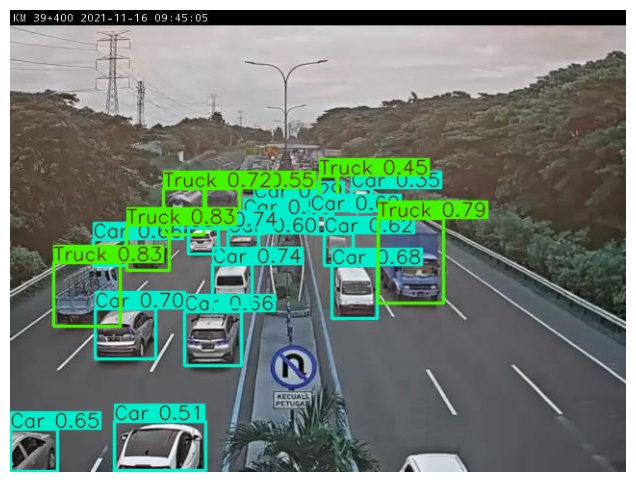


image 1/1 /content/Dataset/test/images/i821.png: 480x384 2 Trafic Light Signals, 1 Stop Signal, 2 Crosswalk Signals, 19.8ms
Speed: 2.6ms preprocess, 19.8ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 384)


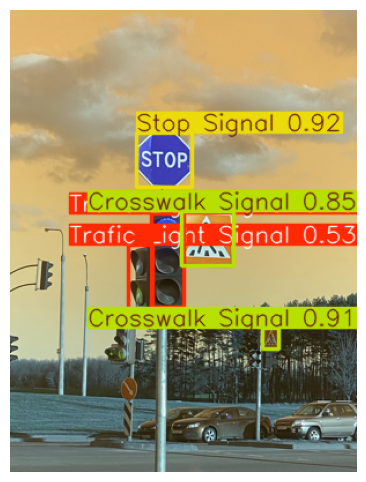


image 1/1 /content/Dataset/test/images/i1040.jpg: 480x480 1 Crosswalk, 13.8ms
Speed: 3.1ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 480)


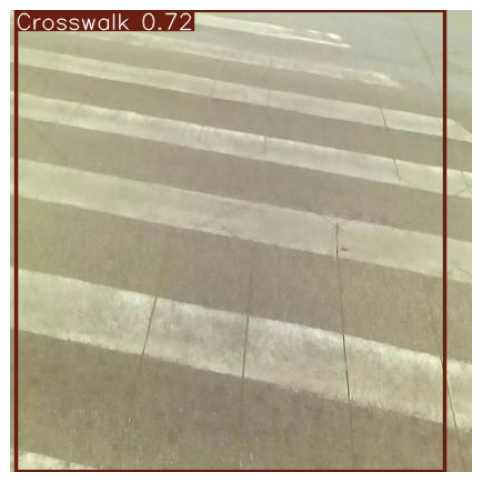


image 1/1 /content/Dataset/test/images/i1691.jpg: 384x480 1 Bus, 10 Cars, 7 Trucks, 15.4ms
Speed: 2.0ms preprocess, 15.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 480)


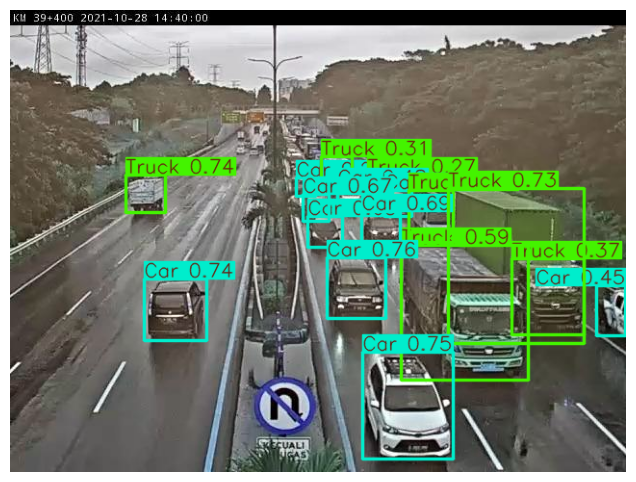


image 1/1 /content/Dataset/test/images/i607.png: 480x384 1 Speedlimit Signal, 16.8ms
Speed: 2.2ms preprocess, 16.8ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 384)


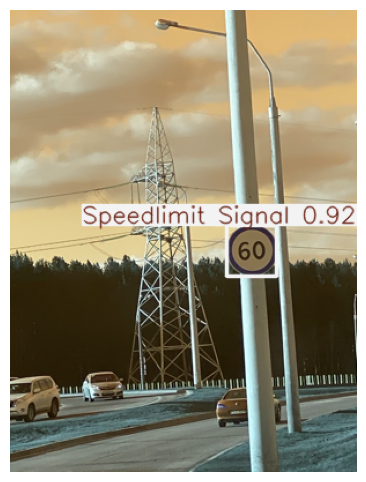


image 1/1 /content/Dataset/test/images/i1057.jpg: 480x480 2 Pedestrians, 21.0ms
Speed: 2.8ms preprocess, 21.0ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 480)


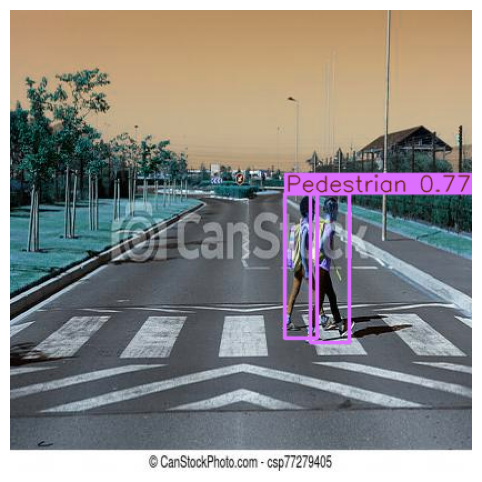


image 1/1 /content/Dataset/test/images/i1452.jpg: 384x480 10 Cars, 6 Trucks, 13.6ms
Speed: 2.9ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 480)


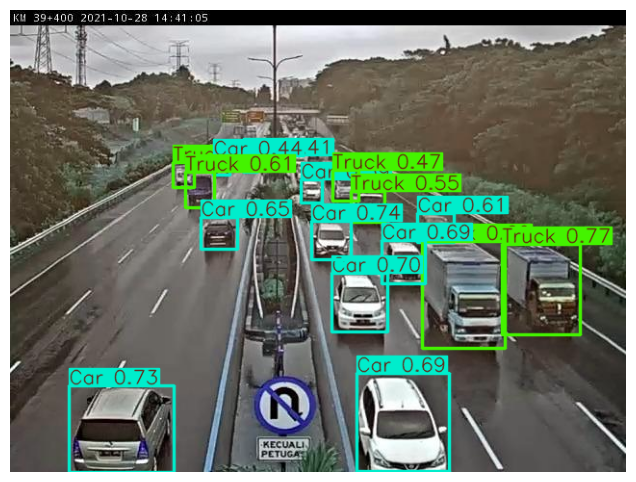


image 1/1 /content/Dataset/test/images/i610.png: 480x384 1 Speedlimit Signal, 12.3ms
Speed: 2.3ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 384)


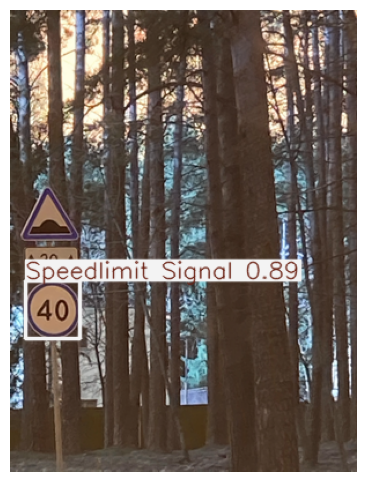


image 1/1 /content/Dataset/test/images/i405.png: 480x384 1 Speedlimit Signal, 11.4ms
Speed: 2.2ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


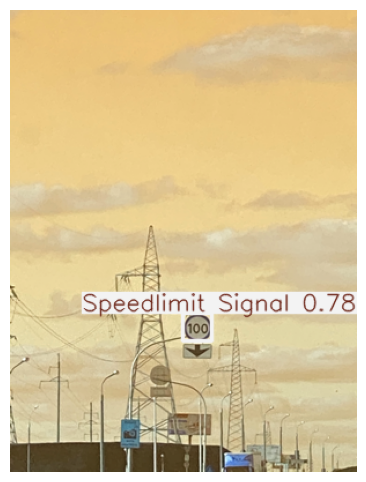


image 1/1 /content/Dataset/test/images/i377.png: 480x384 1 Speedlimit Signal, 19.2ms
Speed: 2.3ms preprocess, 19.2ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 384)


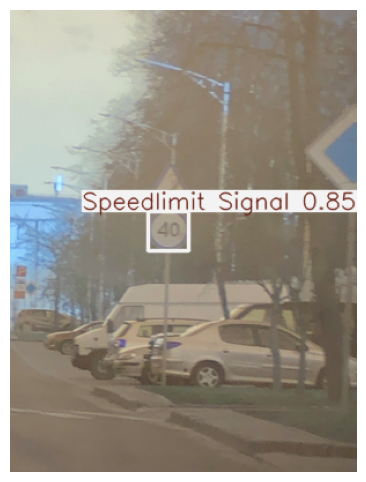


image 1/1 /content/Dataset/test/images/i604.png: 480x384 1 Speedlimit Signal, 11.4ms
Speed: 2.2ms preprocess, 11.4ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 384)


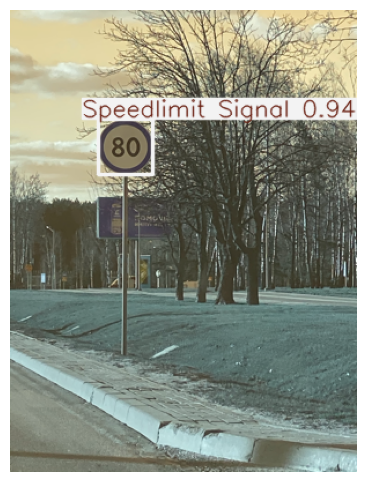


image 1/1 /content/Dataset/test/images/i983.jpg: 480x480 1 Crosswalk, 15.2ms
Speed: 3.1ms preprocess, 15.2ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 480)


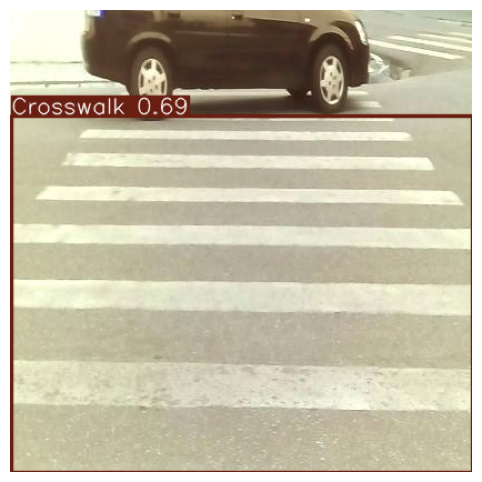


image 1/1 /content/Dataset/test/images/i389.png: 480x384 1 Speedlimit Signal, 14.7ms
Speed: 2.2ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 384)


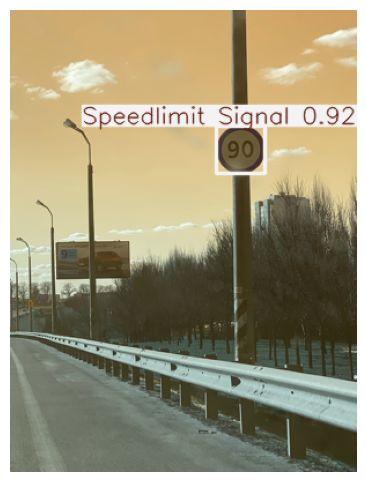


image 1/1 /content/Dataset/test/images/i360.png: 480x384 1 Speedlimit Signal, 18.7ms
Speed: 7.3ms preprocess, 18.7ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 384)


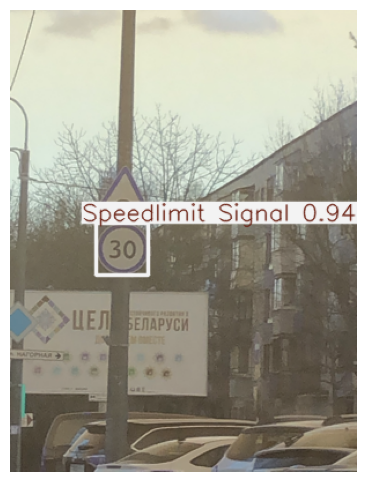


image 1/1 /content/Dataset/test/images/i799.png: 480x384 1 Speedlimit Signal, 1 Crosswalk Signal, 21.1ms
Speed: 2.5ms preprocess, 21.1ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 384)


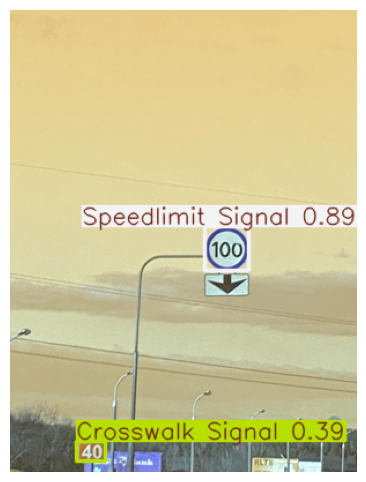


image 1/1 /content/Dataset/test/images/i558.png: 480x384 1 Speedlimit Signal, 27.9ms
Speed: 2.2ms preprocess, 27.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


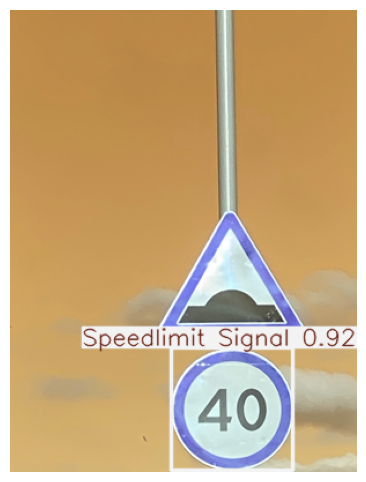


image 1/1 /content/Dataset/test/images/i162.png: 480x384 1 Speedlimit Signal, 14.0ms
Speed: 2.8ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 384)


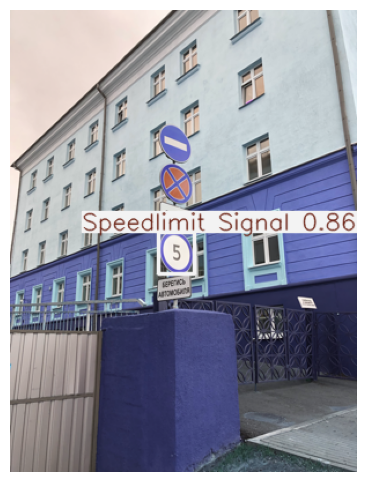


image 1/1 /content/Dataset/test/images/i1309.jpg: 384x480 4 Cars, 2 Trucks, 15.3ms
Speed: 2.5ms preprocess, 15.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 480)


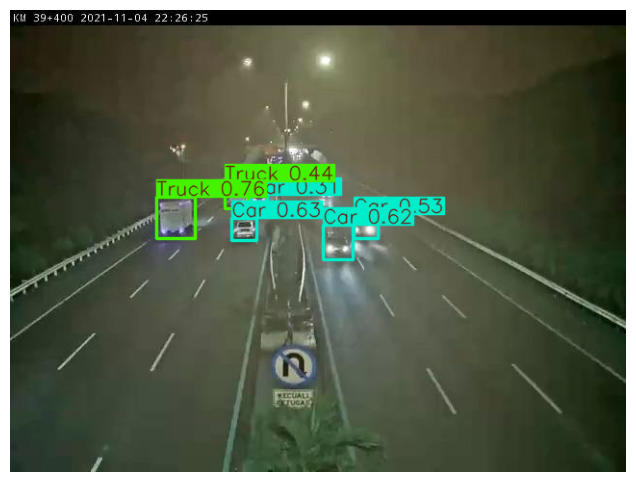


image 1/1 /content/Dataset/test/images/i4.png: 480x320 4 Trafic Light Signals, 13.0ms
Speed: 1.9ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 320)


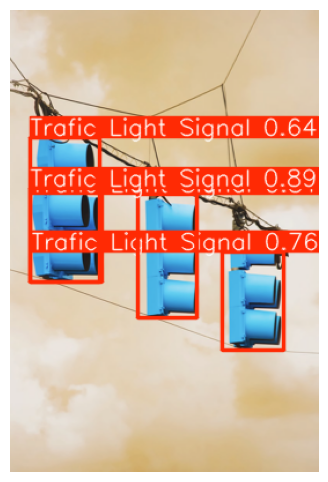


image 1/1 /content/Dataset/test/images/i1447.jpg: 384x480 7 Cars, 1 Truck, 21.5ms
Speed: 2.5ms preprocess, 21.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 480)


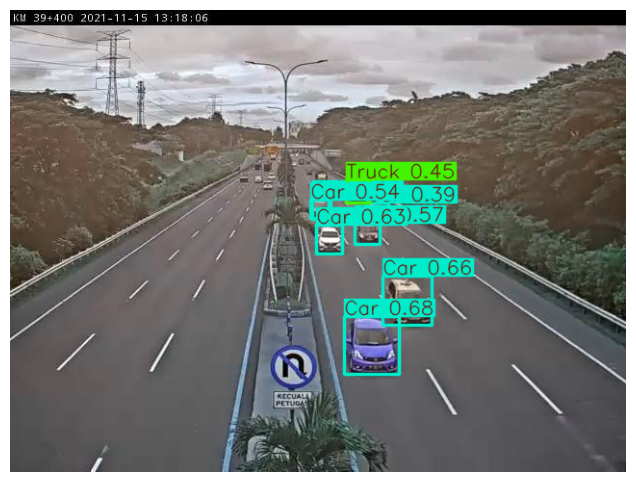


image 1/1 /content/Dataset/test/images/i95.png: 480x384 1 Stop Signal, 14.6ms
Speed: 2.3ms preprocess, 14.6ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 384)


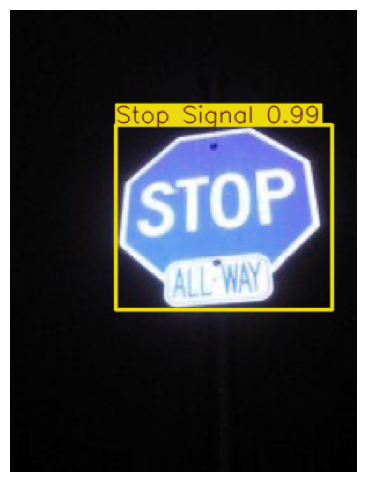


image 1/1 /content/Dataset/test/images/i1692.jpg: 384x480 1 Bus, 10 Cars, 8 Trucks, 23.1ms
Speed: 9.5ms preprocess, 23.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 480)


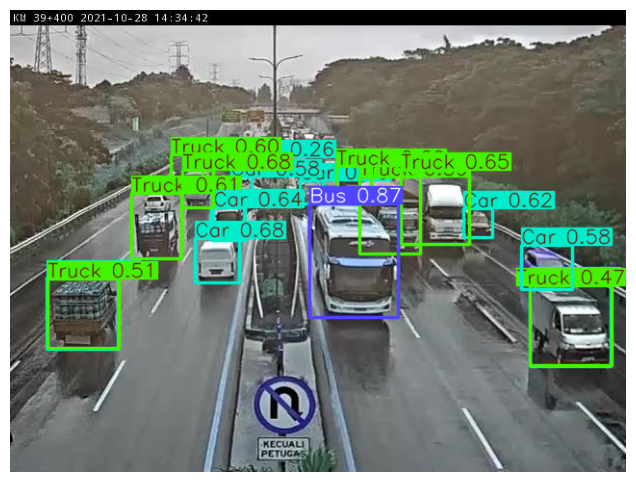


image 1/1 /content/Dataset/test/images/i175.png: 480x384 1 Speedlimit Signal, 21.5ms
Speed: 2.2ms preprocess, 21.5ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 384)


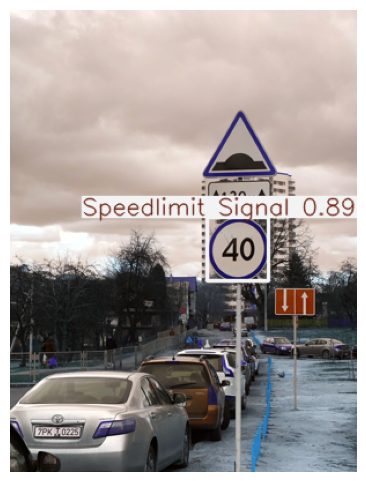


image 1/1 /content/Dataset/test/images/i758.png: 480x384 1 Speedlimit Signal, 15.9ms
Speed: 2.3ms preprocess, 15.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


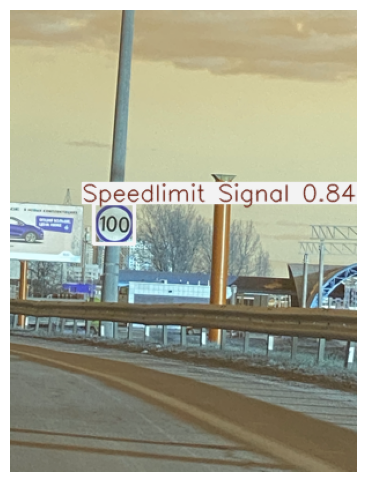


image 1/1 /content/Dataset/test/images/i148.png: 384x480 1 Crosswalk Signal, 22.1ms
Speed: 2.2ms preprocess, 22.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 480)


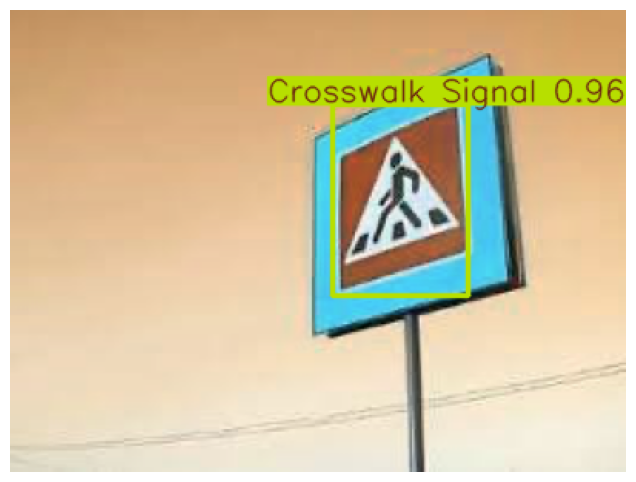


image 1/1 /content/Dataset/test/images/i201.png: 480x384 1 Speedlimit Signal, 26.3ms
Speed: 8.2ms preprocess, 26.3ms inference, 3.4ms postprocess per image at shape (1, 3, 480, 384)


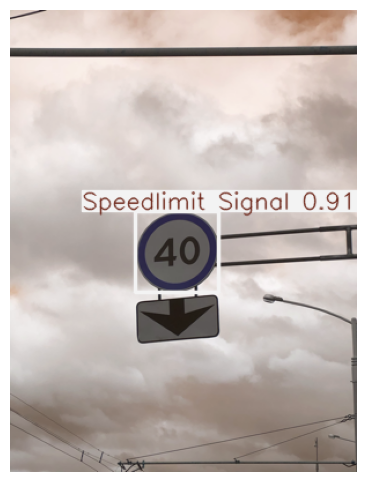


image 1/1 /content/Dataset/test/images/i613.png: 480x384 1 Speedlimit Signal, 13.8ms
Speed: 7.3ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


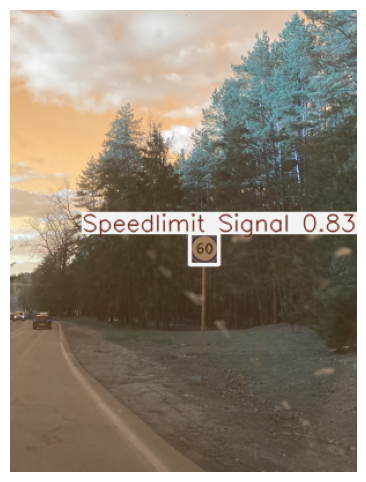


image 1/1 /content/Dataset/test/images/i1068.jpg: 480x480 1 Crosswalk, 19.6ms
Speed: 2.8ms preprocess, 19.6ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 480)


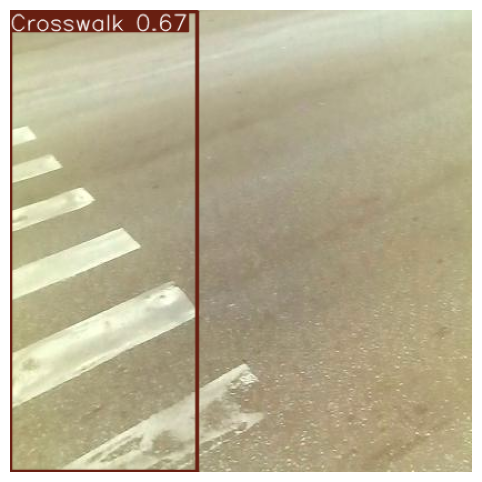


image 1/1 /content/Dataset/test/images/i1718.jpg: 384x480 11 Cars, 9 Trucks, 16.7ms
Speed: 2.5ms preprocess, 16.7ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 480)


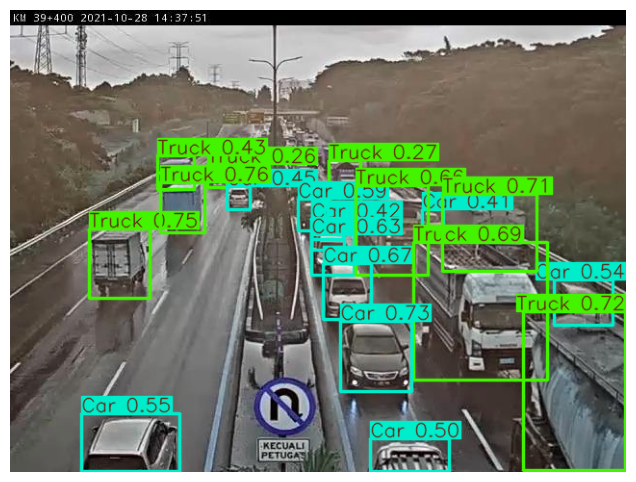


image 1/1 /content/Dataset/test/images/i1450.jpg: 384x480 5 Cars, 8 Trucks, 18.2ms
Speed: 2.4ms preprocess, 18.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 480)


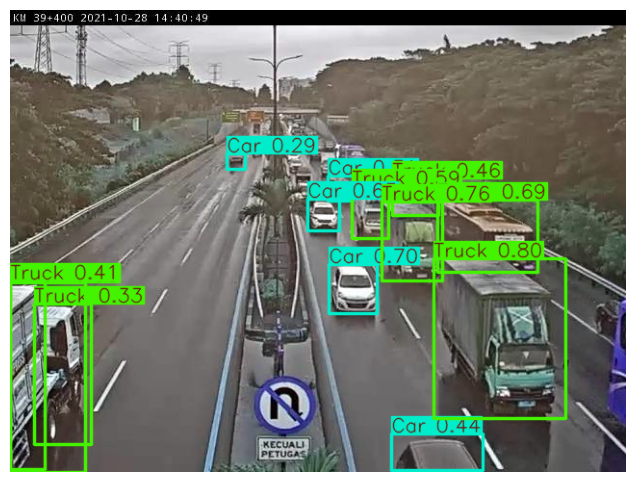


image 1/1 /content/Dataset/test/images/i410.png: 480x384 1 Speedlimit Signal, 17.6ms
Speed: 5.3ms preprocess, 17.6ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 384)


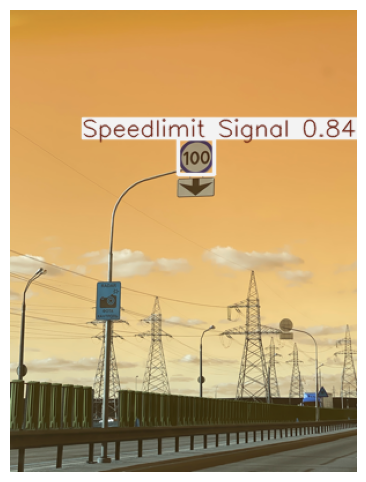


image 1/1 /content/Dataset/test/images/i1267.jpg: 320x480 3 Pedestrians, 20.9ms
Speed: 10.4ms preprocess, 20.9ms inference, 3.9ms postprocess per image at shape (1, 3, 320, 480)


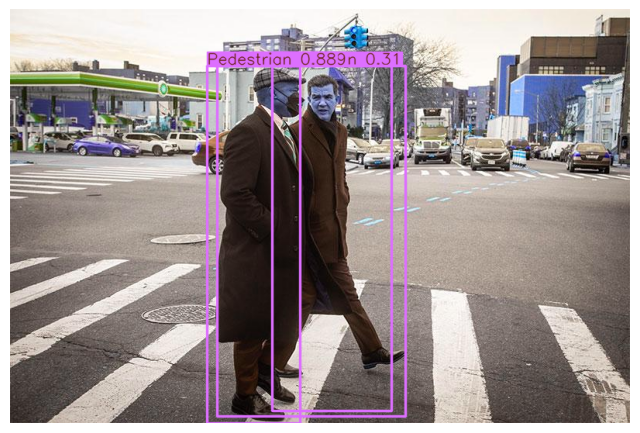


image 1/1 /content/Dataset/test/images/i798.png: 480x384 1 Speedlimit Signal, 23.3ms
Speed: 2.5ms preprocess, 23.3ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 384)


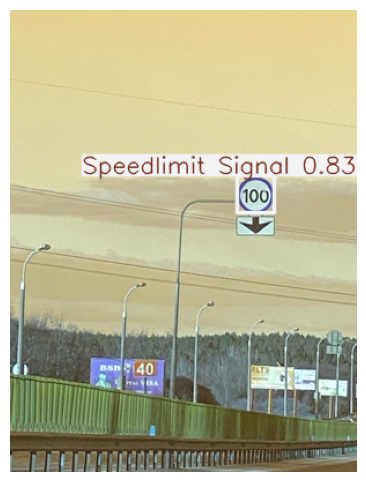


image 1/1 /content/Dataset/test/images/i1453.jpg: 384x480 1 Bus, 9 Cars, 6 Trucks, 18.5ms
Speed: 4.1ms preprocess, 18.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 480)


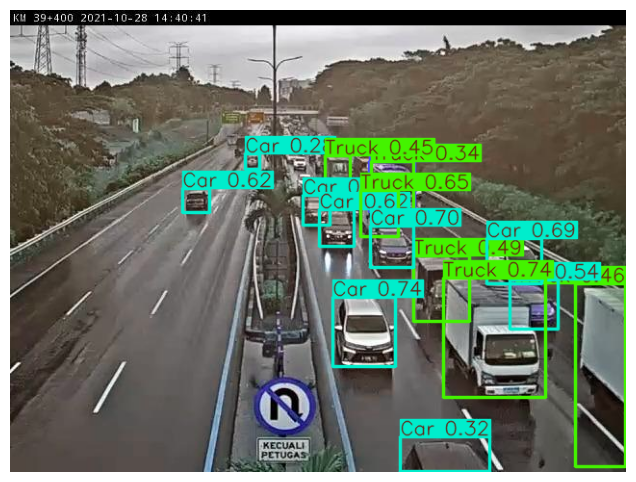


image 1/1 /content/Dataset/test/images/i968.jpg: 480x480 1 Crosswalk, 17.6ms
Speed: 3.2ms preprocess, 17.6ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 480)


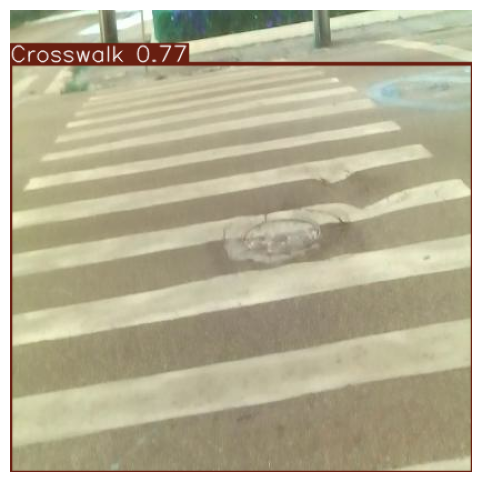


image 1/1 /content/Dataset/test/images/i1485.jpg: 384x480 1 Bus, 11 Cars, 11 Trucks, 18.0ms
Speed: 8.3ms preprocess, 18.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 480)


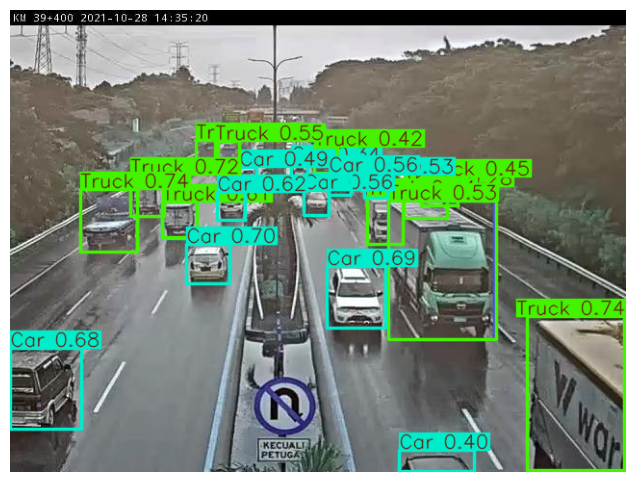


image 1/1 /content/Dataset/test/images/i388.png: 480x384 1 Speedlimit Signal, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


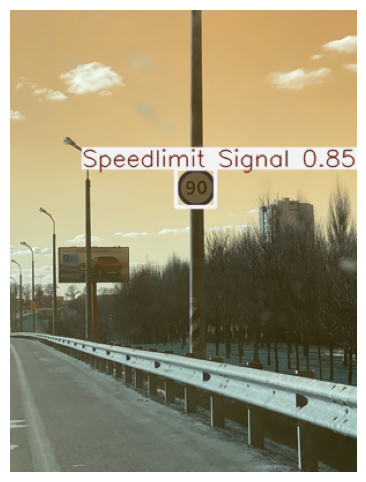

In [ ]:
import random
import matplotlib.pyplot as plt
from ultralytics import YOLO
import cv2
import os

image_dir = r"/content/Dataset/test/images"

all_images = os.listdir(image_dir)
selected_images = all_images[:45]

for img_name in selected_images:
    img_path = os.path.join(image_dir, img_name)
    results = model.predict(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for result in results:
        plotted_img = result.plot()
        plt.figure(figsize=(8, 6))
        plt.imshow(plotted_img)
        plt.axis('off')
        plt.show()